#HW1 - Data Exploration and Preparation

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [44]:
from matplotlib import pylab
params = {'xtick.labelsize': 18,
 'ytick.labelsize': 18,
 'axes.titlesize' : 22,
 'axes.labelsize' : 20,
 'legend.fontsize': 18,
 'legend.title_fontsize': 22,
 'figure.titlesize': 24
 }
pylab.rcParams.update(params)

## Loading the dataset

In [45]:
dataset = pd.read_csv("virus_data.csv")

In [46]:
#(Q1)
dataset.shape

(1250, 26)

In [47]:
#(Q2)
dataset.num_of_siblings.value_counts()

1    399
2    317
0    271
3    161
4     62
5     31
6      6
7      2
8      1
Name: num_of_siblings, dtype: int64

In [48]:
#(Q3)
dataset
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1250 entries, 0 to 1249
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   patient_id             1250 non-null   int64  
 1   age                    1250 non-null   int64  
 2   sex                    1250 non-null   object 
 3   weight                 1250 non-null   float64
 4   blood_type             1250 non-null   object 
 5   current_location       1250 non-null   object 
 6   num_of_siblings        1250 non-null   int64  
 7   happiness_score        1250 non-null   int64  
 8   household_income       1250 non-null   float64
 9   conversations_per_day  1250 non-null   int64  
 10  sugar_levels           1250 non-null   int64  
 11  sport_activity         1250 non-null   int64  
 12  symptoms               930 non-null    object 
 13  pcr_date               1250 non-null   object 
 14  PCR_01                 1250 non-null   float64
 15  PCR_

In [8]:
dataset.columns

Index(['patient_id', 'age', 'sex', 'weight', 'blood_type', 'current_location',
       'num_of_siblings', 'happiness_score', 'household_income',
       'conversations_per_day', 'sugar_levels', 'sport_activity', 'symptoms',
       'pcr_date', 'PCR_01', 'PCR_02', 'PCR_03', 'PCR_04', 'PCR_05', 'PCR_06',
       'PCR_07', 'PCR_08', 'PCR_09', 'PCR_10', 'spread', 'risk'],
      dtype='object')

In [9]:
dataset.pcr_date

0       2020-07-04
1       2020-06-13
2       2020-05-30
3       2020-09-20
4       2020-07-31
           ...    
1245    2020-01-02
1246    2020-08-01
1247    2021-07-19
1248    2020-01-17
1249    2021-05-18
Name: pcr_date, Length: 1250, dtype: object

In [10]:
from pandas.core.common import random_state
import sklearn
from sklearn import model_selection
training_set, test_set = sklearn.model_selection.train_test_split(dataset,test_size = 0.2, random_state = 53)


In [11]:
training_set.shape
test_set.shape

(250, 26)

In [12]:
dataset.size

32500

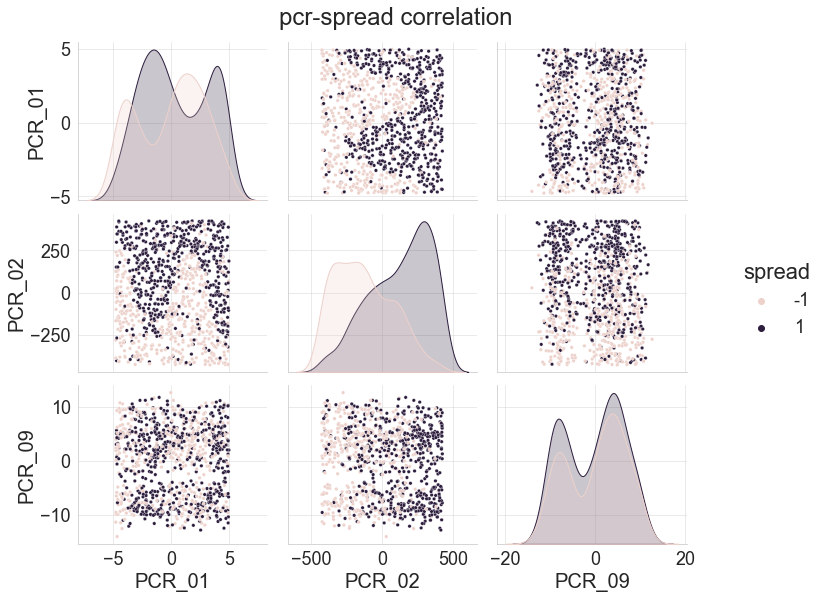

In [13]:
g = sns.pairplot(training_set[["spread", "PCR_01", "PCR_02", "PCR_09"]], plot_kws={"s": 12}, hue = "spread")
g.fig.suptitle("pcr-spread correlation", y=1.04)
for ax in np.ravel(g.axes):
 ax.grid(alpha=0.5)
g.fig.set_size_inches(12,8)

In [14]:
from sklearn.base import BaseEstimator,ClassifierMixin
import scipy
class kNN(BaseEstimator, ClassifierMixin):
  def __init__(self, n_neighbors:int = 3):
    self.n_neighbors = n_neighbors
    self.training_features = []
    self.training_labels = []
  def __call__(self):
    print("i'm called")
  def fit(self, X, y):
    self.training_features = np.copy(X)
    self.training_labels = np.copy(y)
    return self
  def predict(self, X):
# Note: You can use self.n_neighbors here
    dist = scipy.spatial.distance.cdist(X, self.training_features, 'euclidean')
    index_arrays =  np.argpartition(dist, kth=self.n_neighbors)
    k_index_arrays = index_arrays[:,:self.n_neighbors]
    label_arrays = np.take(np.array(self.training_labels), k_index_arrays)
    sum_arrays = np.sum(label_arrays, axis = 1)
    predictions = np.sign(sum_arrays)
 # TODO: compute the predicted labels (+1 or -1)
    return predictions

In [15]:
#import sys
#sys.path.append('/content/visualize_clf.py')
#import visualize_clf

In [16]:
def visualize_clf(clf, X, Y, title, 
                  xlabel, ylabel,
                  marker_size=50,
                  grid_length=300,
                  linewidths=None):
    import matplotlib.pyplot as plt
    import pandas as pd
    from matplotlib.colors import ListedColormap
    
    if isinstance(X, pd.DataFrame):
        X = X.to_numpy()
        
    # For internal use here, make sure labels are 0 and 1
    Y = np.ravel(Y).astype(int)
    labels = set(Y)
    assert len(labels) == 2, "Can only visualize two unique labels"

    if labels == set([-1,1]):
      Y = (Y + 1) // 2
      labels = set(Y)
    
    assert labels == set([0,1]), "Could not handle given labels"

    plt.figure(figsize=(8, 8))

    # Parameters
    n_classes = 2
    markers = ["D", "o"]
    palette = sns.color_palette("hls", 2)
    custom_cmap = ListedColormap(palette.as_hex())

    x_delta = np.abs(X[:, 0].max() - X[:, 0].min()) * 0.1
    y_delta = np.abs(X[:, 1].max() - X[:, 1].min()) * 0.1
    x_min, x_max = X[:, 0].min() - x_delta, X[:, 0].max() + x_delta
    y_min, y_max = X[:, 1].min() - y_delta, X[:, 1].max() + y_delta
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, grid_length),
                         np.linspace(y_min, y_max, grid_length))
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    cs = plt.contourf(xx, yy, Z, cmap=custom_cmap, alpha=0.35)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(alpha=0.75)

    # Plot the training points
    for i, color, marker in zip(labels, palette, markers):
        idx = np.where(Y == i)
        plt.scatter(X[idx, 0], X[idx, 1], color=color,
                    marker=marker,
                    edgecolor='white', s=marker_size,
                    linewidths=linewidths)

    plt.title(title, fontsize=20)
    plt.axis("tight")
    plt.show()

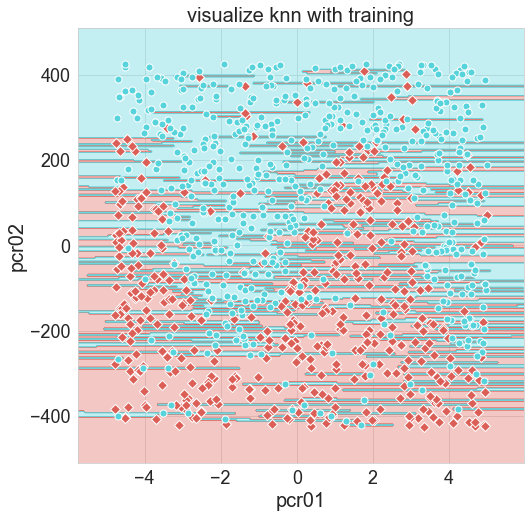

1.0

In [17]:
knn = kNN(1)
df_features = pd.DataFrame(training_set[['PCR_01', 'PCR_02']]).to_numpy()
df_labels = pd.DataFrame(training_set[['spread']]).to_numpy()
knn.fit(df_features, df_labels)
visualize_clf(knn, df_features, df_labels, 'visualize knn with training', 'pcr01', 'pcr02')
knn.score(df_features, df_labels)

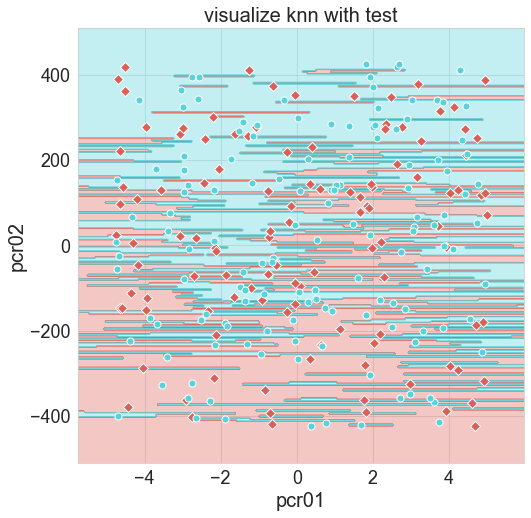

0.72

In [18]:
df_test_features = pd.DataFrame(test_set[['PCR_01', 'PCR_02']]).to_numpy()
df_test_labels = pd.DataFrame(test_set[['spread']]).to_numpy()
visualize_clf(knn, df_features, df_test_labels, 'visualize knn with test', 'pcr01', 'pcr02')
knn.score(df_test_features, df_test_labels)

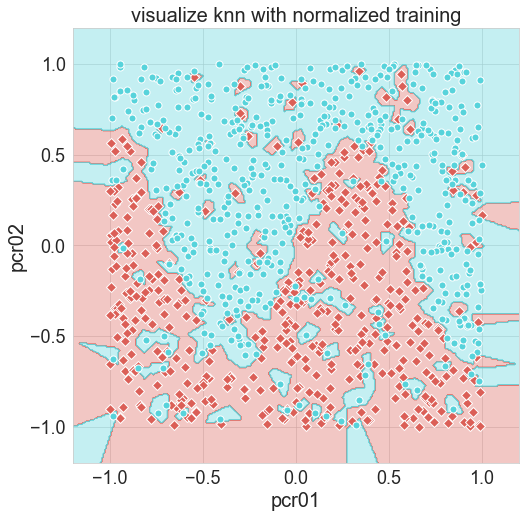

1.0

In [19]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler((-1,1))
scaler.fit(df_features)
normalaized_set = scaler.transform(df_features)
knn.fit(normalaized_set, df_labels)
visualize_clf(knn, normalaized_set, df_labels, 'visualize knn with normalized training', 'pcr01', 'pcr02')
knn.score(normalaized_set, df_labels)

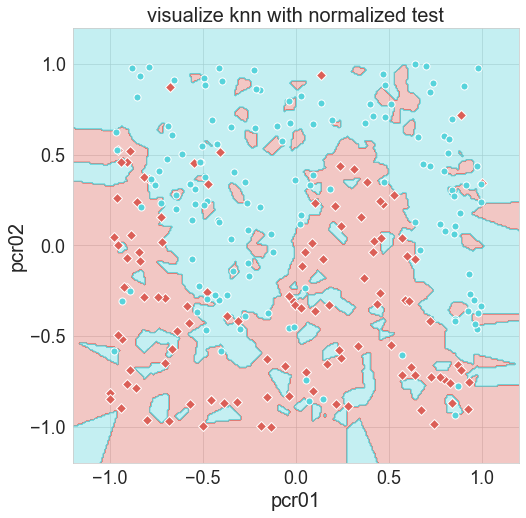

0.8

In [20]:
scaler.fit(df_test_features)
normalaized_test_set = scaler.transform(df_test_features)
visualize_clf(knn, normalaized_test_set, df_test_labels, 'visualize knn with normalized test', 'pcr01', 'pcr02')
knn.score(normalaized_test_set, df_test_labels)

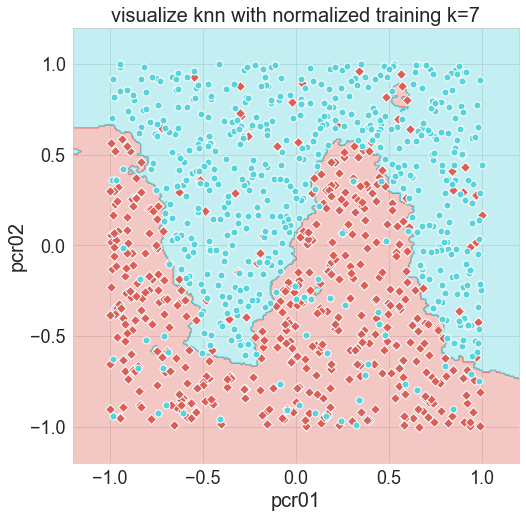

0.888

In [21]:
knn = kNN(7)
knn.fit(normalaized_set, df_labels)
visualize_clf(knn, normalaized_set, df_labels, 'visualize knn with normalized training k=7', 'pcr01', 'pcr02')
knn.score(normalaized_set, df_labels)

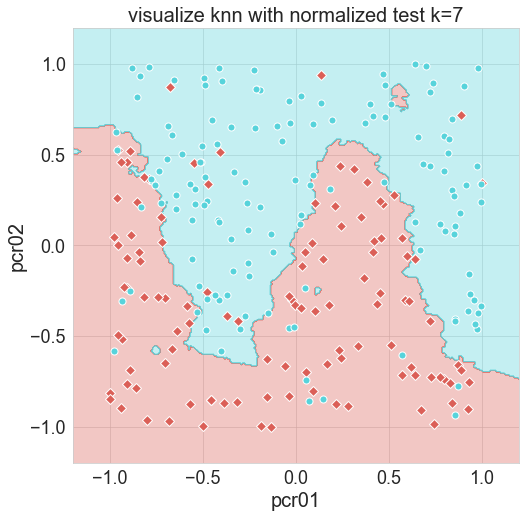

0.86

In [22]:
visualize_clf(knn, normalaized_test_set, df_test_labels, 'visualize knn with normalized test k=7', 'pcr01', 'pcr02')
knn.score(normalaized_test_set, df_test_labels)

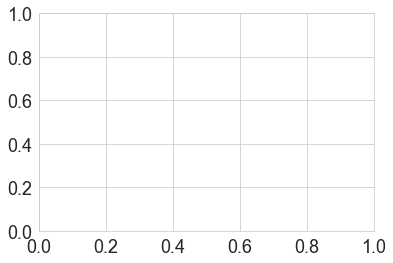

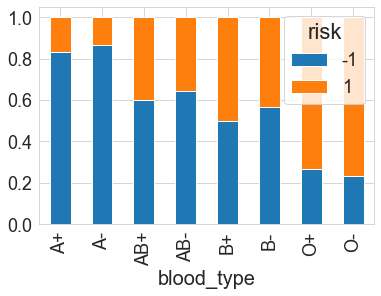

In [23]:
fig, ax = plt.subplots(sharey = False)
_ = pd.crosstab(training_set['blood_type'], training_set['risk'], normalize="index").plot(kind = 'bar', stacked = True)

In [24]:
dataset['A'] = dataset["blood_type"].isin(["A+", "A-"]).apply(lambda x: int(x))
dataset['B'] = dataset["blood_type"].isin(["B+", "B-", "AB+", "AB-"]).apply(lambda x: int(x))
dataset['O'] = dataset["blood_type"].isin(["O+", "O-"]).apply(lambda x: int(x))
dataset = dataset.drop('blood_type', 1)

C:\Users\97254\AppData\Local\Temp/ipykernel_3236/1821417466.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  dataset = dataset.drop('blood_type', 1)


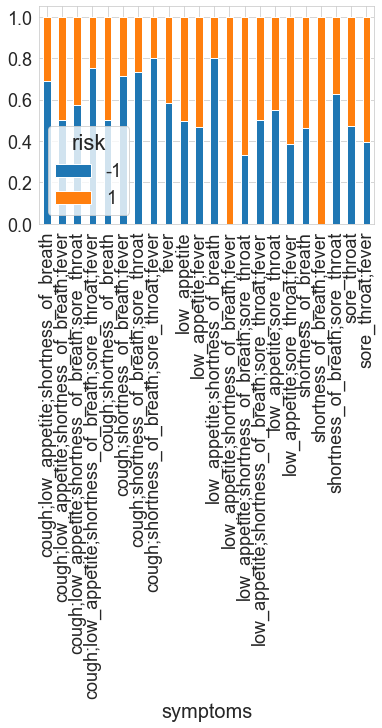

In [25]:
dataset['symptoms'].value_counts()
_ = pd.crosstab(training_set['symptoms'], training_set['risk'], normalize="index").plot(kind = 'bar', stacked = True)

In [26]:
dataset["low_appetite"] = dataset["symptoms"].str.contains("low_appetite").fillna(value = False).apply(lambda x: int(x))
dataset["cough"] = dataset["symptoms"].str.contains("cough").fillna(value = False).apply(lambda x: int(x))
dataset["shortness_of_breath"] = dataset["symptoms"].str.contains("shortness_of_breath").fillna(value = False).apply(lambda x: int(x))
dataset["fever"] = dataset["symptoms"].str.contains("fever").fillna(value = False).apply(lambda x: int(x))
dataset["sore_throat"] = dataset["symptoms"].str.contains("sore_throat").fillna(value = False).apply(lambda x: int(x))
dataset = dataset.drop('symptoms', 1)

C:\Users\97254\AppData\Local\Temp/ipykernel_3236/3789354381.py:6: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  dataset = dataset.drop('symptoms', 1)


In [27]:
dataset["current_location_x"] = dataset["current_location"].apply(lambda x: (x.split(","))[0][2:-1])
dataset["current_location_y"] = dataset["current_location"].apply(lambda x: (x.split(","))[1][2:-2])
dataset = dataset.drop('current_location', 1)

C:\Users\97254\AppData\Local\Temp/ipykernel_3236/2677713683.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  dataset = dataset.drop('current_location', 1)


In [28]:
import datetime
date = dataset["pcr_date"][0]
print(date +", " +date[0:4]+", "+date[5:7]+", "+date[8:10])
ts= (datetime.datetime(int(date[0:4]),int(date[5:7]),int(date[8:10]),0,0) - datetime.datetime(1970,1,1)).total_seconds()
print(ts)

2020-07-04, 2020, 07, 04
1593820800.0


In [29]:
dataset["time_stamp_pcr"] = dataset["pcr_date"].apply(lambda x: (datetime.datetime(int(x[0:4]),int(x[5:7]),int(x[8:10]),0,0) - datetime.datetime(1970,1,1)).total_seconds())
dataset = dataset.drop('pcr_date', 1)

C:\Users\97254\AppData\Local\Temp/ipykernel_3236/3954163703.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  dataset = dataset.drop('pcr_date', 1)


In [30]:
dataset

,patient_id,age,sex,weight,num_of_siblings,happiness_score,household_income,conversations_per_day,sugar_levels,sport_activity,...,B,O,low_appetite,cough,shortness_of_breath,fever,sore_throat,current_location_x,current_location_y,time_stamp_pcr
0,312,7,F,24.7,2,8,312.3,3,79,1,...,0,0,1,0,0,0,1,32.44874,-99.73314,1.593821e+09
1,787,21,M,86.3,4,6,641.5,1,84,2,...,0,1,1,0,0,0,0,38.07789,13.44275,1.592006e+09
2,1150,28,M,98.9,1,9,864.2,9,113,0,...,0,1,0,0,0,0,0,38.07789,13.44275,1.590797e+09
3,947,20,F,55.9,3,8,428.3,3,95,3,...,0,1,0,0,0,0,0,51.40148,-1.32471,1.600560e+09
4,889,44,M,47.2,3,7,371.1,1,43,3,...,0,1,0,0,0,0,1,44.27804,-88.27205,1.596154e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,1028,32,F,54.0,1,9,398.6,4,81,1,...,0,1,1,0,0,0,0,52.48173,-2.12139,1.577923e+09
1246,286,36,M,73.4,2,7,563.1,2,75,0,...,0,0,0,0,0,0,0,10.31672,123.89071,1.596240e+09
1247,1493,13,M,45.2,1,9,725.4,13,102,1,...,0,0,1,0,1,0,0,25.92493,73.66633,1.626653e+09
1248,1750,35,M,98.2,2,8,935.8,3,110,3,...,0,1,0,0,0,0,1,6.15038,6.83042,1.579219e+09


In [31]:
dataset

,patient_id,age,sex,weight,num_of_siblings,happiness_score,household_income,conversations_per_day,sugar_levels,sport_activity,...,B,O,low_appetite,cough,shortness_of_breath,fever,sore_throat,current_location_x,current_location_y,time_stamp_pcr
0,312,7,F,24.7,2,8,312.3,3,79,1,...,0,0,1,0,0,0,1,32.44874,-99.73314,1.593821e+09
1,787,21,M,86.3,4,6,641.5,1,84,2,...,0,1,1,0,0,0,0,38.07789,13.44275,1.592006e+09
2,1150,28,M,98.9,1,9,864.2,9,113,0,...,0,1,0,0,0,0,0,38.07789,13.44275,1.590797e+09
3,947,20,F,55.9,3,8,428.3,3,95,3,...,0,1,0,0,0,0,0,51.40148,-1.32471,1.600560e+09
4,889,44,M,47.2,3,7,371.1,1,43,3,...,0,1,0,0,0,0,1,44.27804,-88.27205,1.596154e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,1028,32,F,54.0,1,9,398.6,4,81,1,...,0,1,1,0,0,0,0,52.48173,-2.12139,1.577923e+09
1246,286,36,M,73.4,2,7,563.1,2,75,0,...,0,0,0,0,0,0,0,10.31672,123.89071,1.596240e+09
1247,1493,13,M,45.2,1,9,725.4,13,102,1,...,0,0,1,0,1,0,0,25.92493,73.66633,1.626653e+09
1248,1750,35,M,98.2,2,8,935.8,3,110,3,...,0,1,0,0,0,0,1,6.15038,6.83042,1.579219e+09


,patient_id,age,sex,weight,num_of_siblings,happiness_score,household_income,conversations_per_day,sugar_levels,sport_activity,...,B,O,low_appetite,cough,shortness_of_breath,fever,sore_throat,current_location_x,current_location_y,time_stamp_pcr
0,312,7,1,24.7,2,8,312.3,3,79,1,...,0,0,1,0,0,0,1,32.44874,-99.73314,1.593821e+09
1,787,21,0,86.3,4,6,641.5,1,84,2,...,0,1,1,0,0,0,0,38.07789,13.44275,1.592006e+09
2,1150,28,0,98.9,1,9,864.2,9,113,0,...,0,1,0,0,0,0,0,38.07789,13.44275,1.590797e+09
3,947,20,1,55.9,3,8,428.3,3,95,3,...,0,1,0,0,0,0,0,51.40148,-1.32471,1.600560e+09
4,889,44,0,47.2,3,7,371.1,1,43,3,...,0,1,0,0,0,0,1,44.27804,-88.27205,1.596154e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,1028,32,1,54.0,1,9,398.6,4,81,1,...,0,1,1,0,0,0,0,52.48173,-2.12139,1.577923e+09
1246,286,36,0,73.4,2,7,563.1,2,75,0,...,0,0,0,0,0,0,0,10.31672,123.89071,1.596240e+09
1247,1493,13,0,45.2,1,9,725.4,13,102,1,...,0,0,1,0,1,0,0,25.92493,73.66633,1.626653e+09
1248,1750,35,0,98.2,2,8,935.8,3,110,3,...,0,1,0,0,0,0,1,6.15038,6.83042,1.579219e+09


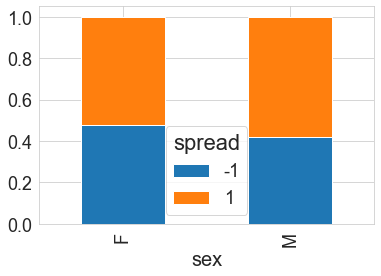

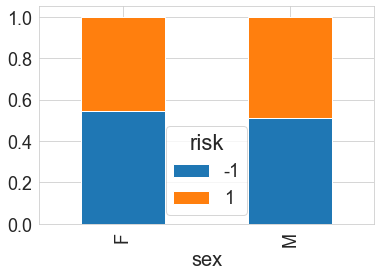

In [36]:
_ = pd.crosstab(training_set['sex'], training_set['spread'], normalize="index").plot(kind = 'bar', stacked = True)
_ = pd.crosstab(training_set['sex'], training_set['risk'], normalize="index").plot(kind = 'bar', stacked = True)
dataset['sex'] = dataset['sex'].replace(['M'], 0)
dataset['sex'] = dataset['sex'].replace(['F'], 1)
dataset
# dataset = dataset.drop('sex', 1)

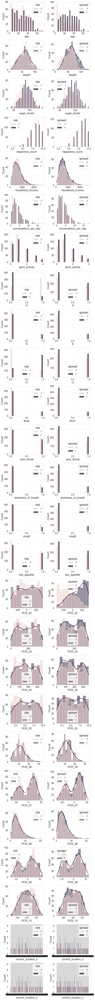

In [41]:
training_set, test_set = sklearn.model_selection.train_test_split(dataset,test_size = 0.2, random_state = 53)
COL_NAME = ['age', 'weight','sugar_levels', 'happiness_score', 'household_income', 'conversations_per_day', 'sport_activity', 'A', 'B', 'O', 'fever', 'sore_throat', 'shortness_of_breath', 'cough', 'low_appetite','PCR_02', 'PCR_03', 'PCR_04', 'PCR_05', 'PCR_06', 'PCR_07', 'PCR_08', 'PCR_09', 'PCR_10', 'current_location_x', 'current_location_y']
COLS, ROWS = (2, len(COL_NAME))
plt.figure(figsize=(5 * COLS, 4 * ROWS))
for row in range(ROWS):
 column = COL_NAME[row]
 for j, cls in enumerate(["risk", "spread"]):
    plt.subplot(ROWS,COLS, row * COLS + 1 + j)
    isContinuous = "float" in training_set[column].dtype.name
    sns.histplot(data=training_set, x=column, hue=cls, line_kws={"linewidth": 3},
    kde=isContinuous, multiple="layer" if isContinuous else "dodge")
    plt.grid(alpha=0.5)
plt.tight_layout()

In [42]:
s = training_set.corr().risk.abs()
s.sort_values(kind="quicksort", ascending=False)

risk                     1.000000
A                        0.491772
O                        0.487258
cough                    0.072468
weight                   0.071977
shortness_of_breath      0.062346
PCR_06                   0.056947
PCR_01                   0.055184
PCR_03                   0.054455
spread                   0.052225
sugar_levels             0.051584
age                      0.045568
PCR_09                   0.042105
patient_id               0.039829
household_income         0.032662
conversations_per_day    0.027912
num_of_siblings          0.027084
PCR_05                   0.023388
sport_activity           0.020900
sore_throat              0.015288
PCR_08                   0.015192
PCR_04                   0.013901
fever                    0.013767
time_stamp_pcr           0.010191
low_appetite             0.007941
B                        0.006199
happiness_score          0.005903
PCR_10                   0.004918
PCR_02                   0.004824
PCR_07        

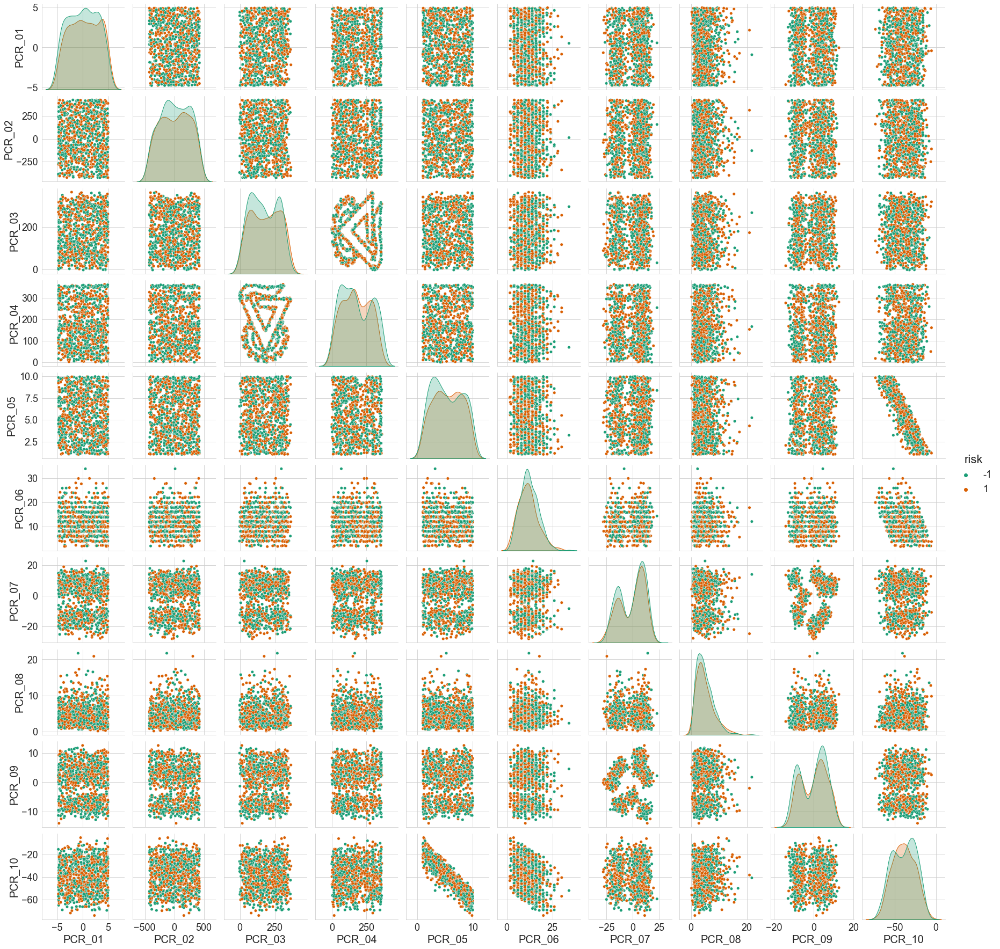

In [43]:
sns.pairplot(training_set[training_set.filter(like='PCR').columns.tolist() + ["risk"]],
 plot_kws={"s": 30}, hue="risk", palette='Dark2')

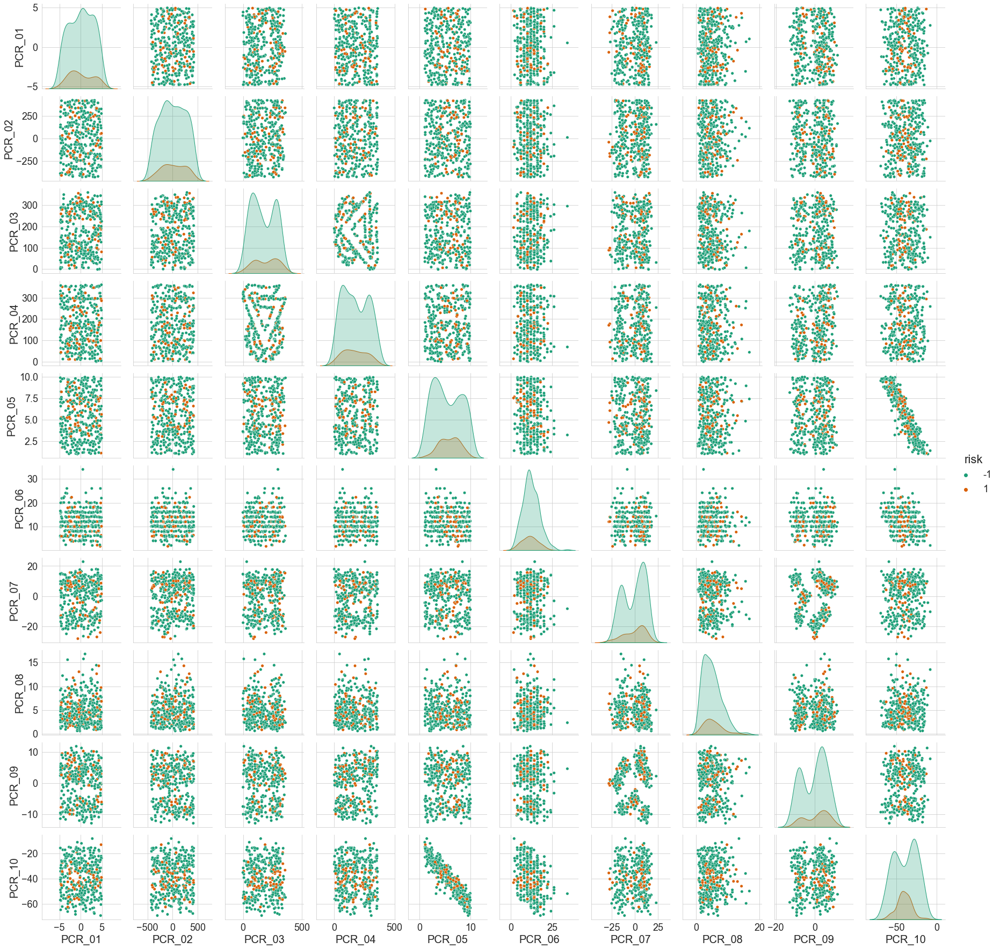

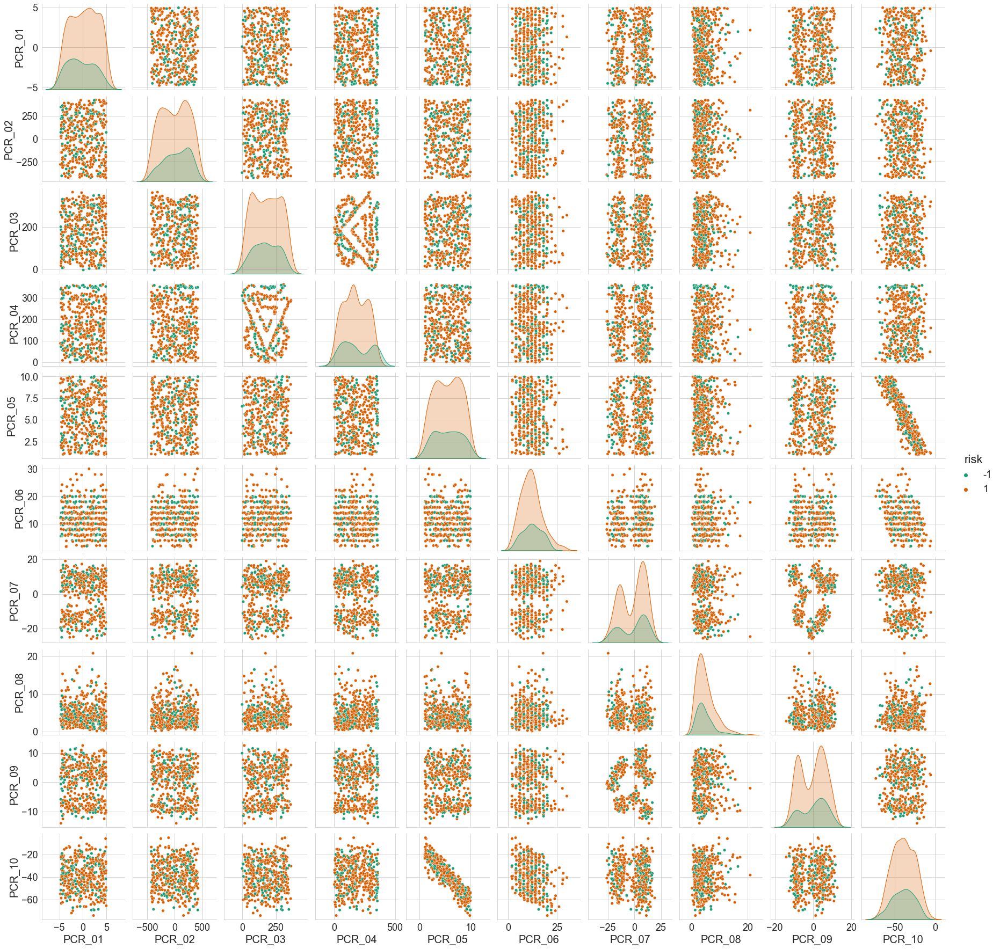

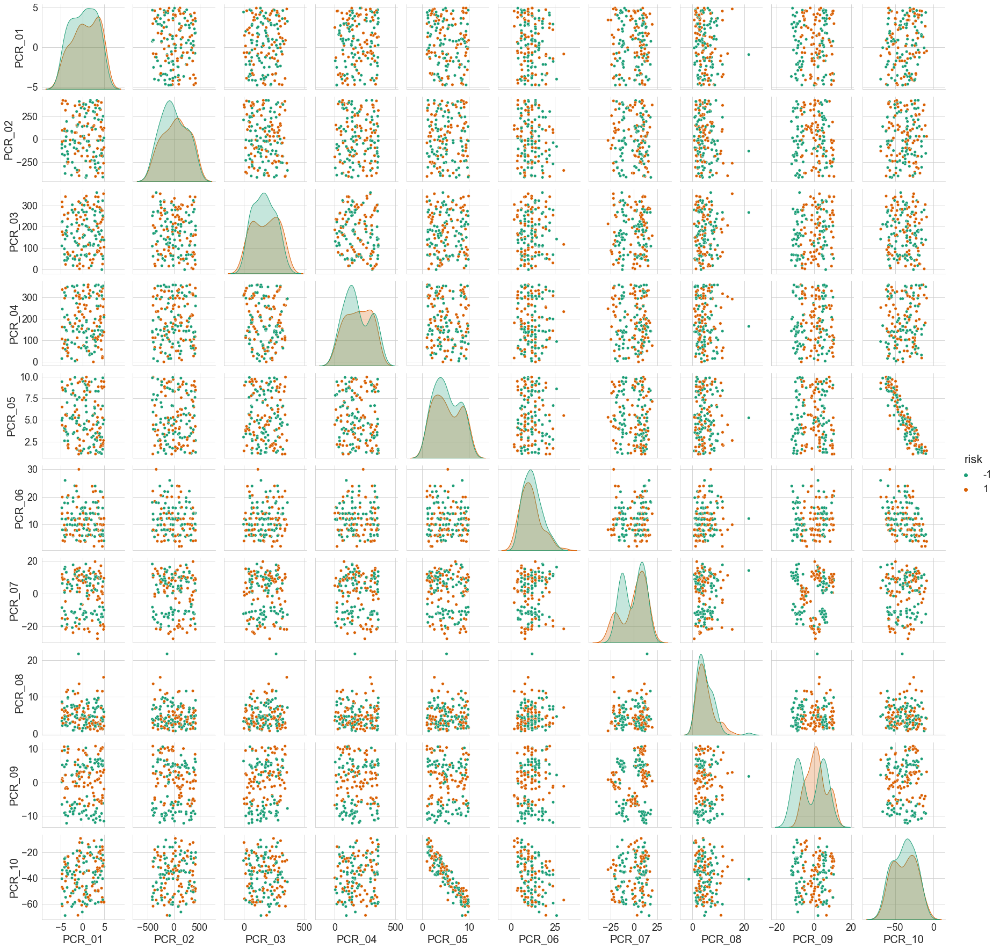

In [44]:
A_df = training_set[training_set['A'] == 1] 
B_df = training_set[training_set['B'] == 1] 
O_df = training_set[training_set['O'] == 1]

sns.pairplot(A_df[B_df.filter(like='PCR').columns.tolist() + ["risk"]],
 plot_kws={"s": 30}, hue="risk", palette='Dark2')

sns.pairplot(O_df[B_df.filter(like='PCR').columns.tolist() + ["risk"]],
 plot_kws={"s": 30}, hue="risk", palette='Dark2')

sns.pairplot(B_df[B_df.filter(like='PCR').columns.tolist() + ["risk"]],
 plot_kws={"s": 30}, hue="risk", palette='Dark2')

Text(0.5, 0.98, 'Blood group O')

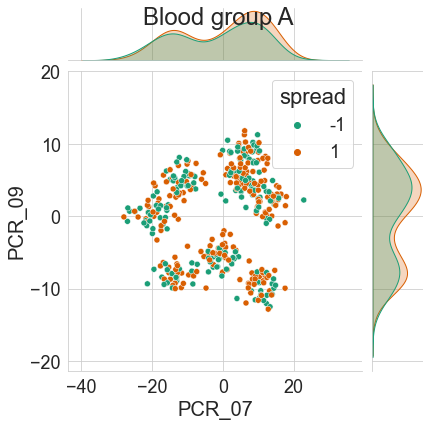

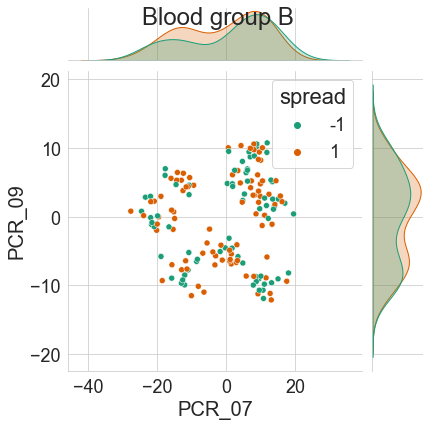

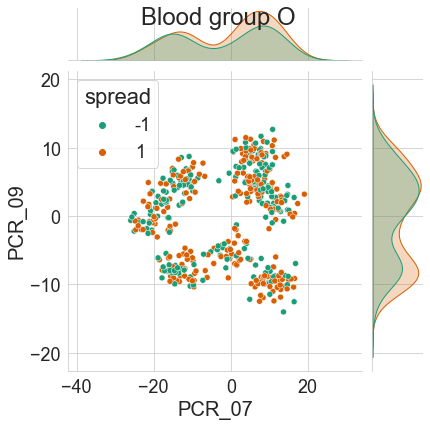

In [45]:
p_A = sns.jointplot(data=A_df, x='PCR_07', y='PCR_09', hue='spread', palette = "Dark2")
p_A.fig.suptitle("Blood group A")
p_B = sns.jointplot(data=B_df, x='PCR_07', y='PCR_09', hue='spread', palette = "Dark2")
p_B.fig.suptitle("Blood group B")
p_O = sns.jointplot(data=O_df, x='PCR_07', y='PCR_09', hue='spread', palette = "Dark2")
p_O.fig.suptitle("Blood group O")

Text(0.5, 0.98, 'Blood group O')

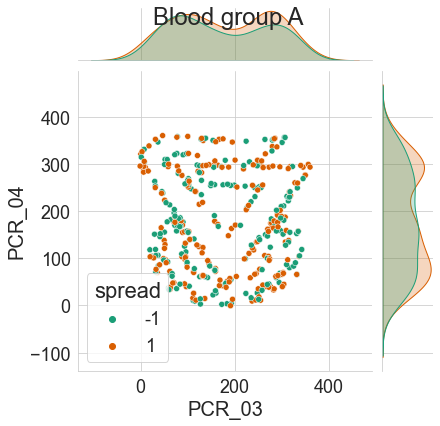

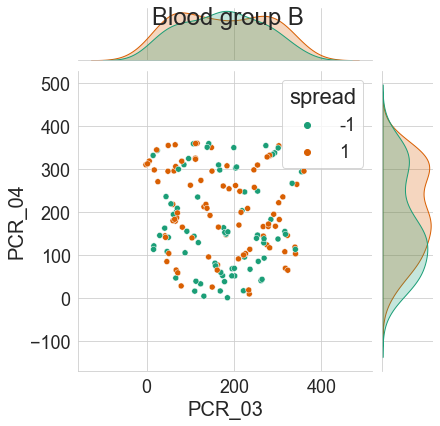

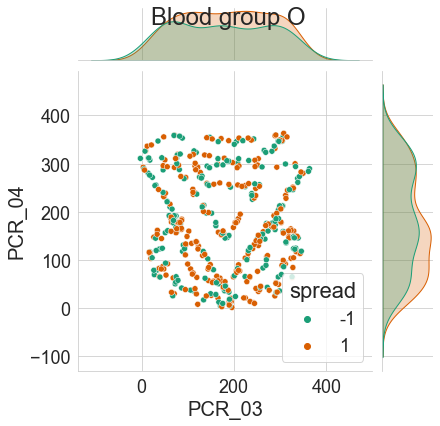

In [46]:
p_A = sns.jointplot(data=A_df, x='PCR_03', y='PCR_04', hue='spread', palette = "Dark2")
p_A.fig.suptitle("Blood group A")
p_B = sns.jointplot(data=B_df, x='PCR_03', y='PCR_04', hue='spread', palette = "Dark2")
p_B.fig.suptitle("Blood group B")
p_O = sns.jointplot(data=O_df, x='PCR_03', y='PCR_04', hue='spread', palette = "Dark2")
p_O.fig.suptitle("Blood group O")

In [47]:
def minMaxNormal(feature):
  df = training_set[[feature]]
  scaler = MinMaxScaler((-1,1))
  scaler.fit(df)
  normalaized = scaler.transform(df)
  training_set[feature] = normalaized

In [48]:
from sklearn.preprocessing import StandardScaler
def stdNormal(feature):
  df = training_set[[feature]]
  scaler = StandardScaler()
  scaler.fit(df)
  normalaized = scaler.transform(df)
  training_set[feature] = normalaized

In [49]:
stdNormal("weight")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/4003593421.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [50]:
minMaxNormal("age")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [51]:
minMaxNormal("num_of_siblings")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [52]:
minMaxNormal("happiness_score")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [53]:
minMaxNormal("household_income")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [54]:
minMaxNormal("conversations_per_day")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [55]:
stdNormal("sugar_levels")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/4003593421.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [56]:
minMaxNormal("sport_activity")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [57]:
for i in range(1,10):
  minMaxNormal("PCR_0"+str(i))
minMaxNormal("PCR_10")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized
C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized
C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See 

In [58]:
minMaxNormal("current_location_x")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [59]:
minMaxNormal("current_location_y")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [60]:
minMaxNormal("time_stamp_pcr")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [61]:
training_set

,patient_id,age,weight,num_of_siblings,happiness_score,household_income,conversations_per_day,sugar_levels,sport_activity,PCR_01,...,B,O,low_appetite,cough,shortness_of_breath,fever,sore_throat,current_location_x,current_location_y,time_stamp_pcr
265,429,-0.420290,1.245297,-0.50,1.00,-0.854249,-0.555556,0.365061,-0.5,-0.563842,...,0,1,1,0,0,0,0,0.690796,-0.051275,-0.939560
336,1306,-0.652174,-1.341621,-1.00,0.50,-0.299200,-0.777778,-2.553730,1.0,0.978077,...,0,1,0,0,0,0,1,0.759804,-0.058788,-0.458791
589,1485,-0.420290,0.746067,-0.50,0.25,-0.821437,-0.666667,1.108026,-1.0,-0.402281,...,0,1,0,0,0,0,0,0.744665,-0.056790,0.538462
532,102,0.072464,0.237760,-1.00,0.75,-0.515734,-0.111111,0.524268,0.0,-0.995722,...,0,0,1,0,0,0,0,0.599250,0.797250,-0.747253
1009,1349,0.188406,0.092530,-0.75,1.00,-0.723223,0.111111,-1.439282,0.0,-0.287737,...,0,1,0,0,0,1,0,0.429886,0.753872,-0.230769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
662,1064,-0.536232,0.283145,-0.50,1.00,-0.835638,-0.888889,-1.492351,-0.5,-0.817210,...,1,0,0,0,0,0,1,0.566143,0.063160,0.472527
1213,1466,0.188406,0.587221,-0.75,0.75,-0.341879,-0.333333,-0.908593,-0.5,0.500060,...,0,0,1,0,0,0,1,0.345819,-0.603158,0.659341
421,54,-0.594203,-0.547392,-1.00,0.25,-0.532925,-0.666667,0.205854,0.5,-0.110783,...,0,1,0,0,0,0,0,0.409800,0.379960,0.870879
885,1572,-1.000000,-2.376388,-0.75,0.50,-0.935122,-1.000000,-2.182248,-0.5,0.874556,...,1,0,0,1,1,1,0,0.561673,-0.579265,0.120879


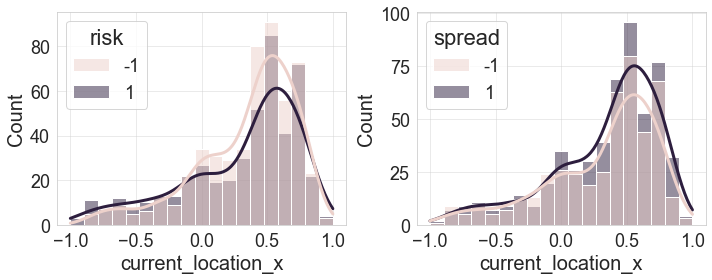

In [62]:
COL_NAME = ['current_location_x']
COLS, ROWS = (2, len(COL_NAME))
plt.figure(figsize=(5 * COLS, 4 * ROWS))
for row in range(ROWS):
 column = COL_NAME[row]
 for j, cls in enumerate(["risk", "spread"]):
    plt.subplot(ROWS,COLS, row * COLS + 1 + j)
    isContinuous = "float" in training_set[column].dtype.name
    sns.histplot(data=training_set, x=column, hue=cls, line_kws={"linewidth": 3},
    kde=isContinuous, multiple="layer" if isContinuous else "dodge")
    plt.grid(alpha=0.5)
plt.tight_layout()

In [63]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)
sfs = SequentialFeatureSelector(knn, n_features_to_select=3)
train_feature = training_set.drop(["spread", "risk"], axis=1)
sfs.fit(train_feature, np.ravel(training_set[["spread"]]) )
SequentialFeatureSelector(estimator=KNeighborsClassifier(n_neighbors=5),
                          n_features_to_select=3)
sfs.get_support()

array([False, False,  True, False, False, False, False, False, False,
        True,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [66]:
train_feature.columns

Index(['patient_id', 'age', 'weight', 'num_of_siblings', 'happiness_score',
       'household_income', 'conversations_per_day', 'sugar_levels',
       'sport_activity', 'PCR_01', 'PCR_02', 'PCR_03', 'PCR_04', 'PCR_05',
       'PCR_06', 'PCR_07', 'PCR_08', 'PCR_09', 'PCR_10', 'A', 'B', 'O',
       'low_appetite', 'cough', 'shortness_of_breath', 'fever', 'sore_throat',
       'current_location_x', 'current_location_y', 'time_stamp_pcr'],
      dtype='object')

In [65]:
def preprare_data(training_data, new_data):
  

IndentationError: expected an indented block (Temp/ipykernel_3328/3070747531.py, line 2)

In [ ]:
# from google.colab import files
# outputPath = "saved_file.csv"
# dataset.to_csv(outputPath)
# files.download(outputPath)